# YOLO v5 Model

- Official docs: https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading/#base64-results
- [Tutorial](https://medium.com/mlearning-ai/training-yolov5-custom-dataset-with-ease-e4f6272148ad#:~:text=Those%20YOLOv5%20models%20are%20able,set%20of%20classes%20and%20images.)

In [2]:
import torch

In [4]:
!pip install -r https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

In [2]:
# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in C:\Users\Ankush/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-6-26 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [1]:
from skimage import io

img = io.imread("TACO/data/batch_1/000000.jpg")

import matplotlib.pyplot as plt

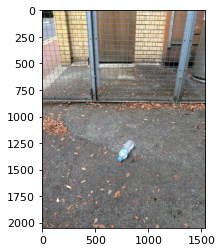

In [98]:
plt.imshow(img)

In [99]:
preds = model(img)

In [102]:
preds.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,709.402283,1222.341553,870.360718,1425.401611,0.839762,39,bottle


In [108]:
pred = preds.pandas().xyxy[0]
pred

,xmin,ymin,xmax,ymax,confidence,class,name
0,709.402283,1222.341553,870.360718,1425.401611,0.839762,39,bottle


In [110]:
import pandas as pd

pred[pred.name == "bottle"]

,xmin,ymin,xmax,ymax,confidence,class,name
0,709.402283,1222.341553,870.360718,1425.401611,0.839762,39,bottle


In [82]:
for p in pred.iterrows():
    print(p[1])

xmin           709.402283
ymin          1222.341553
xmax           870.360718
ymax          1425.401611
confidence       0.839762
class                  39
name               bottle
Name: 0, dtype: object


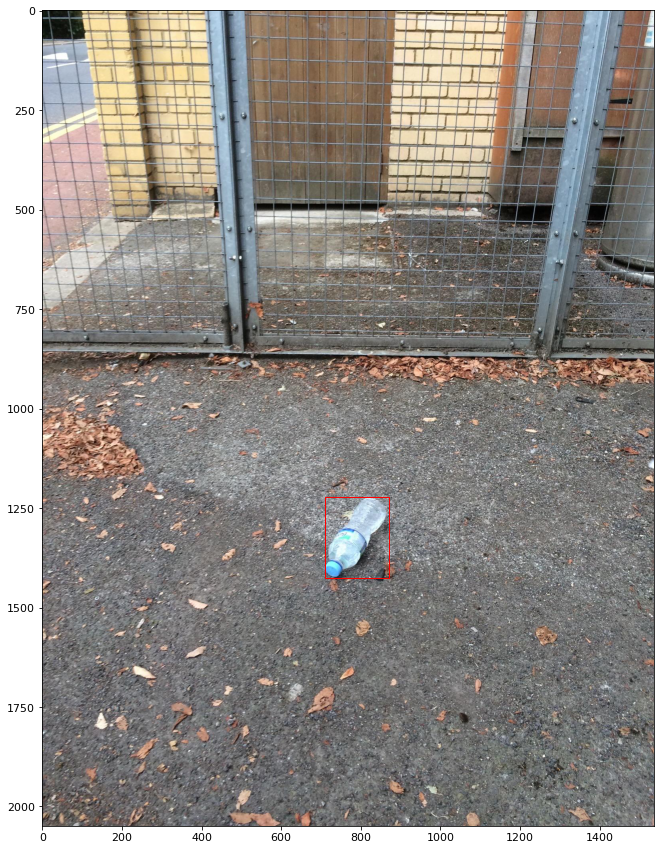

In [83]:
from matplotlib.patches import Rectangle

plt.figure(figsize=(15,15))
plt.imshow(img)
ax = plt.gca()

for pred in preds.pandas().xyxy[0].iterrows():
    
    pred = p[1]
    # Create a Rectangle patch
    ax.add_patch(
     Rectangle((pred[0],pred[1]),pred[2]-pred[0],pred[3]-pred[1],linewidth=1,edgecolor='r',facecolor='none')
    )
    


In [4]:
def predBottle(image_path: str):
    img = io.imread(image_path)
    
    preds = model(img)
    
    preds = preds.pandas().xyxy[0]
    
    preds = preds[preds.name == "bottle"]
    
    return preds

In [130]:
predBottle("TACO/data/batch_1/000010.jpg")

,xmin,ymin,xmax,ymax,confidence,class,name


In [88]:
def showBox(image_path, preds):
    """Wrong"""
    img = io.imread(image_path)
    plt.figure(figsize=(15,15))
    plt.imshow(img)
    ax = plt.gca()
    
    if len(preds) == 0:
        return
    for pred in preds.iterrows():

        # pred = p[1]
        # Create a Rectangle patch
        ax.add_patch(
         Rectangle((pred[0],pred[1]),pred[2]-pred[0],pred[3]-pred[1],linewidth=1,edgecolor='r',facecolor='none')
        )
        

        xmin         ymin        xmax         ymax  confidence  class    name
0  422.23111  1134.214478  669.338257  1360.728638    0.415333     39  bottle


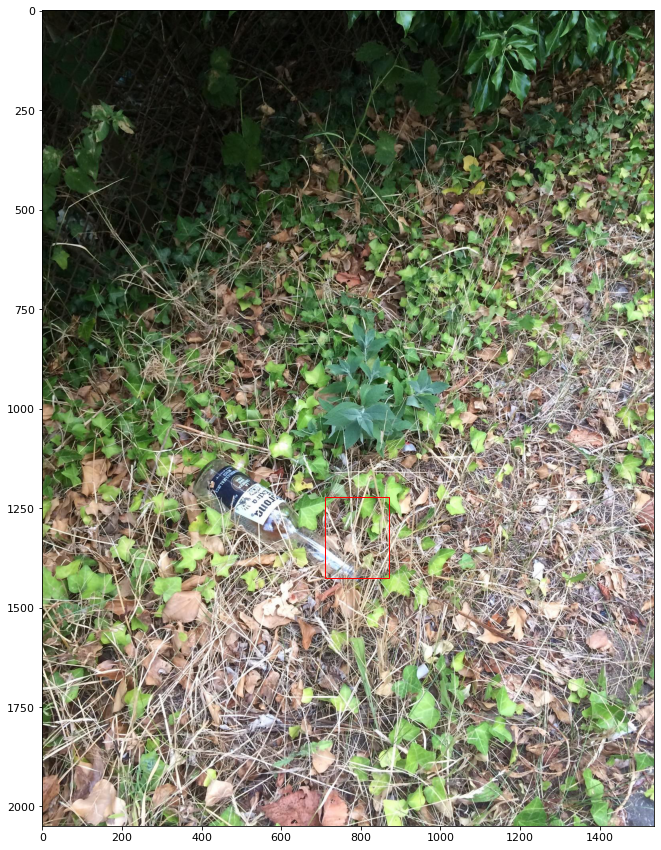

In [138]:
image_path = "TACO/data/batch_1/000012.jpg"
preds = predBottle(image_path)
print(preds)
showBox(image_path, preds)

Trained nano model (50 epochs)

In [3]:
# Model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='trained/yolon50.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\Ankush/.cache\torch\hub\master.zip
YOLOv5  2023-7-11 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 1764577 parameters, 0 gradients, 4.1 GFLOPs
Adding AutoShape... 


In [17]:
from PIL import Image

In [48]:
img = io.imread("Images/test1.jpg")
img2 = Image.open("KILI_COCO/batch_9/003474.jpg")

In [165]:
img2.size

(1280, 720)

In [157]:
from torchvision import transforms
from skimage import io

img = io.imread("Images/test1.jpg")
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(640),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
preprocess(img)

tensor([[[-0.42255, -0.44037, -0.46937,  ...,  0.38687,  0.41587,  0.43368],
         [-0.38107, -0.40299, -0.43869,  ...,  0.42400,  0.46305,  0.48703],
         [-0.31345, -0.34208, -0.38868,  ...,  0.48453,  0.53993,  0.57396],
         ...,
         [-1.62129, -1.60941, -1.59007,  ...,  0.08829,  0.06982,  0.05848],
         [-1.62129, -1.60941, -1.59007,  ...,  0.08915,  0.07613,  0.06814],
         [-1.62129, -1.60941, -1.59007,  ...,  0.08967,  0.08000,  0.07406]],

        [[ 0.69538,  0.68931,  0.67942,  ...,  0.59499,  0.62465,  0.64286],
         [ 0.73779,  0.72542,  0.70527,  ...,  0.63296,  0.67288,  0.69739],
         [ 0.80692,  0.78427,  0.74740,  ...,  0.69484,  0.75148,  0.78626],
         ...,
         [-1.05532, -1.06139, -1.07128,  ...,  0.14970,  0.13082,  0.11922],
         [-1.05532, -1.06139, -1.07128,  ...,  0.15057,  0.13727,  0.12910],
         [-1.05532, -1.06139, -1.07128,  ...,  0.15111,  0.14122,  0.13515]],

        [[ 1.07137,  1.05928,  1.03961,  ...

In [44]:
model([img2])

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 720x1280 2 Plastic bottles
Speed: 6.1ms pre-process, 46.0ms inference, 15.7ms NMS per image at shape (1, 3, 384, 640)

In [43]:
model.conf = 0.25

In [162]:
img = Image.open("Images/test2.jpg")
model(img)

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 435x1008 (no detections)
Speed: 4.3ms pre-process, 57.6ms inference, 0.0ms NMS per image at shape (1, 3, 288, 640)

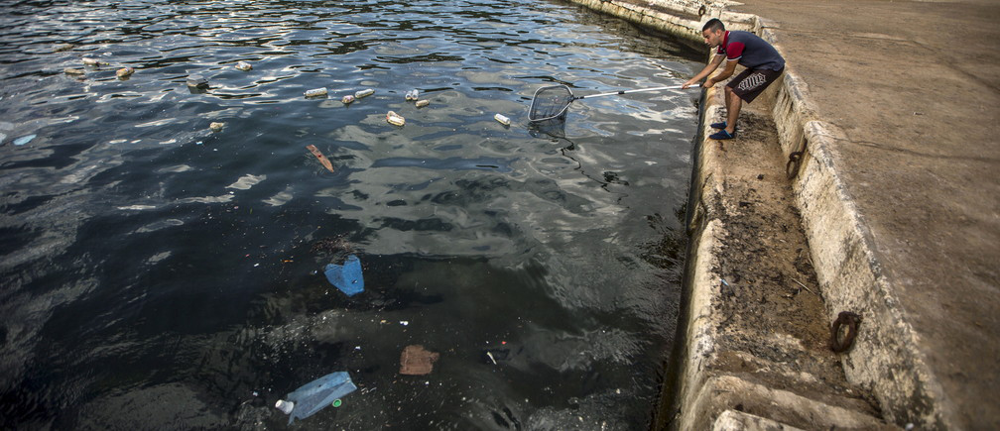

In [163]:
img

In [76]:
# Model
model2 = torch.hub.load('ultralytics/yolov5', 'custom', path='trained/yolon50binary.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\Ankush/.cache\torch\hub\master.zip
YOLOv5  2023-7-11 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
Adding AutoShape... 


In [110]:
model(img)

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 435x1008 (no detections)
Speed: 3.3ms pre-process, 50.8ms inference, 1.0ms NMS per image at shape (1, 3, 288, 640)

In [109]:
model2(img2)

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 720x1280 2 Plastics
Speed: 5.0ms pre-process, 61.9ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)

In [111]:
res = model2(img2)

In [113]:
res.pandas().xywh[0]

,xcenter,ycenter,width,height,confidence,class,name
0,650.814941,513.955017,43.916748,17.264893,0.740761,0,Plastic
1,1270.991943,447.541046,17.233887,8.767395,0.668702,0,Plastic


In [119]:
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt

%matplotlib inline

In [127]:
preds

,xmin,ymin,xmax,ymax,confidence,class,name
0,628.856567,505.322571,672.773315,522.587463,0.740761,0,Plastic
1,1262.375000,443.157349,1279.608887,451.924744,0.668702,0,Plastic


In [146]:
import cv2

In [155]:
preprocess(img)

torch.Size([3, 435, 1008])

In [172]:
img = io.imread("Images/test2.jpg")
img = cv2.resize(img, (1280, 720))

In [173]:
model(img)

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 720x1280 (no detections)
Speed: 2.7ms pre-process, 57.1ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)

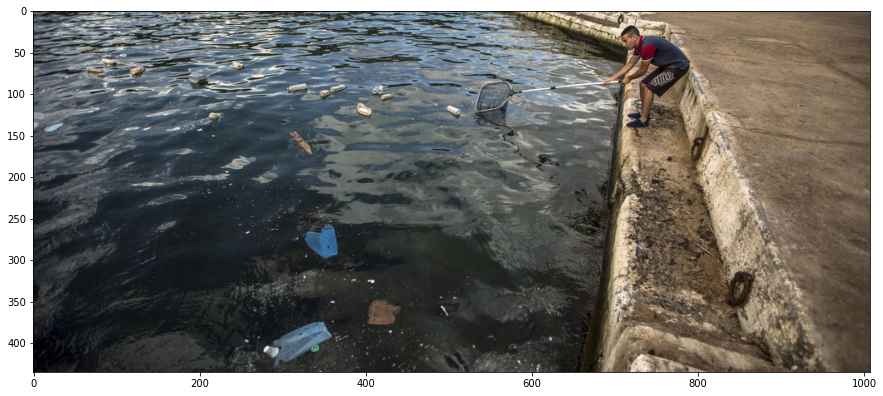

In [148]:
preds = res.pandas().xywhn[0]
img = io.imread("Images/test2.jpg")
plt.figure(figsize=(15,15))
plt.imshow(img)
ax = plt.gca()

for pred in preds.iterrows():

    pred = pred[1]
    # Create a Rectangle patch
    print((pred[0]*img.shape[0],pred[1]*img.shape[1]))
    ax.add_patch(
     Rectangle((719, 221),100,100,linewidth=10,edgecolor='r', facecolor="None")
    )
    ax.add_patch(
     Rectangle((pred[0]*img.shape[0],pred[1]*img.shape[1]),100,100,linewidth=10,edgecolor='r', facecolor="None")
    )
    
# ax

# With SAHI

In [174]:
!pip install sahi

In [178]:
!pip install yolov5

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.4 requires pathlib, which is not installed.
jupyterlab 3.3.2 requires jupyter-server~=1.4, but you have jupyter-server 2.5.0 which is incompatible.


  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=c9329d185ea4a4fb0d098bcdd7305da82607d5805b3ab19fc1b08da3b78435b8
  Stored in directory: c:\users\ankush\appdata\local\pip\cache\wheels\04\5f\3e\46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.4
    Uninstalling pyparsing-3.0.4:
      Successfully uninstalled pyparsing-3.0.4
  Attempting uninstall: idna
    Found existing installation: idna 3.3
    Uninstalling idna-3.3:
      Successfully uninstalled idna-3.3
  Attempting uninstall: certifi
    Found existing installation: certifi 2021.10.8
    Uninstalling certifi-2021.10.8:
      Successfully uninstalled certifi-2021.10.8
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


jupyterlab-server 2.10.3 requires jupyter-server~=1.4, but you have jupyter-server 2.5.0 which is incompatible.


In [175]:
# arrange an instance segmentation model for test
from sahi.utils.yolov5 import (
    download_yolov5s6_model,
)

# import required functions, classes
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [176]:
# download YOLOV5S6 model to 'models/yolov5s6.pt'
yolov5_model_path = 'trained/yolos50.pt'
download_yolov5s6_model(destination_path=yolov5_model_path)

In [179]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu", # or 'cuda:0'
)

YOLOv5  2023-7-11 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [180]:
result = get_prediction("Images/test1.jpg", detection_model)

In [183]:
result.export_visuals(export_dir="Images/")

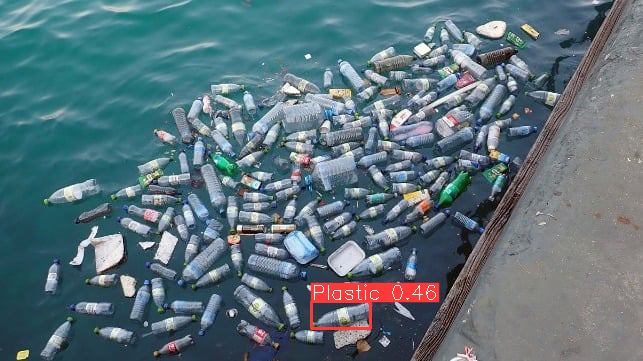

In [186]:
Image("Images/prediction_visual.png")

In [196]:
result = get_sliced_prediction(
    "Implementation/dataset/images/val/1295.jpg",
    detection_model,
    slice_height = 256*2,
    slice_width = 256*2,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

Performing prediction on 60 number of slices.


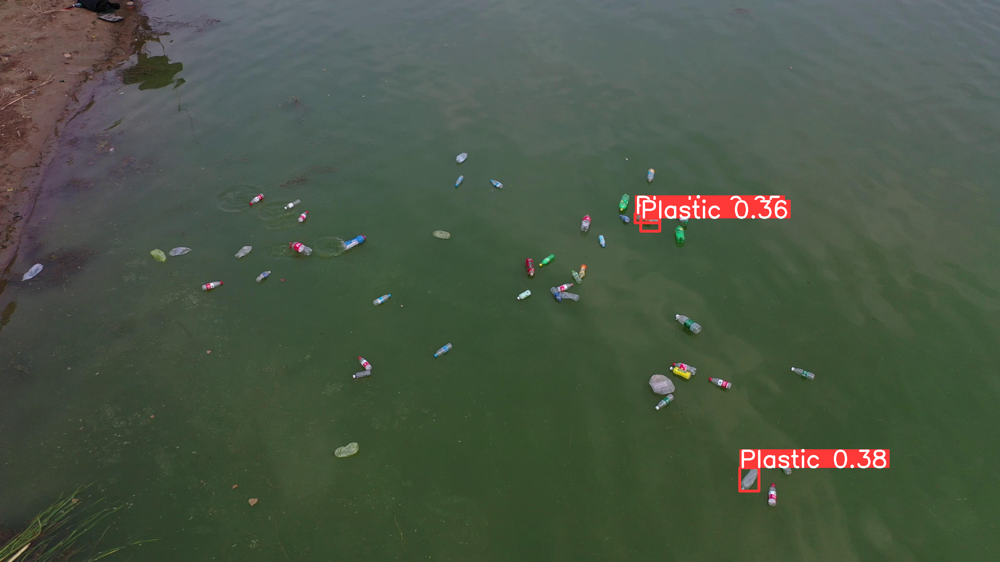

In [197]:
result.export_visuals(export_dir="demo_data/")

Image("demo_data/prediction_visual.png")